In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from keras import optimizers
from sklearn.metrics import mean_squared_error

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [4]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [5]:
def plot_curve(history):
    print('Last train loss: %s'%history.history['loss'][-1])
    print('Last validation loss: %s'%history.history['val_loss'][-1])
    
    # loss curves
    plt.figure(figsize=[8,6])

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(1, len(loss) + 1)

    # Plot loss
    plt.plot(epochs, loss, 'c--', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [6]:
def compare_mse_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [7]:
cloud_cover = preparedata('../succeed-prophet/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


# Train/Test Model ,lags = 30

In [8]:
train = cloud_cover[cloud_cover['DateTime'] < '2021-12-16 00:00:00']
test = cloud_cover[cloud_cover['DateTime'] >= '2021-12-16 00:00:00']

train = train.set_index('DateTime')
test = test.set_index('DateTime')

X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,30)

X_train Shape : (14738, 30, 1)
y_train Shape : (14738, 1)
X_test Shape :  (293, 30, 1)
y_test Shape :  (293, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [9]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### Add frist layer: units = 50

In [10]:
test1 = test.copy()

In [11]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 18s 27ms/step - loss: 0.0095 - accuracy: 0.0087 - val_loss: 0.0054 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 10s 22ms/step - loss: 0.0025 - accuracy: 0.0088 - val_loss: 0.0037 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 9s 20ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0031 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 9s 20ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 9s 19ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 9s 20ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 9s 20ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0

Last train loss: 0.0011991902720183134
Last validation loss: 0.0019056620076298714
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


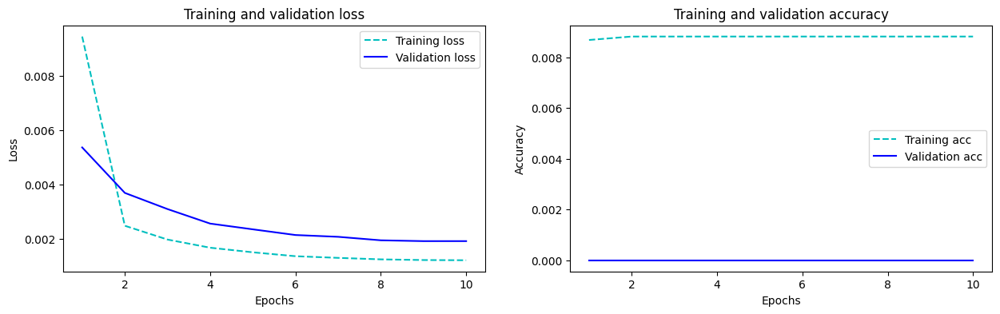

In [12]:
plot_curve(hist_adam)

In [13]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

10/10 [==============================] - 1s 10ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-16 09:10:00,0.111,0.334239
1,2021-12-16 09:11:00,0.112,0.143613
2,2021-12-16 09:12:00,0.116,0.123537
3,2021-12-16 09:13:00,0.112,0.129193
4,2021-12-16 09:14:00,0.099,0.123690
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.172833
289,2021-12-16 13:59:00,0.169,0.172558
290,2021-12-16 14:00:00,0.147,0.173407
291,2021-12-16 14:01:00,0.145,0.154693


In [14]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [15]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_mse_error_unit_50_adam

0.0018961457591912402

In [164]:
mse_data = pd.DataFrame(columns=['Model' ,'LSTM lag30'])
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 adam', lstm_mse_error_unit_50_adam]
mse_data

,Model,LSTM lag30
0,Lstm mse error unit 50 adam,0.001896


----------------------------------------------------------------------------------

## Optimizer RMSprop

### Add frist layer: units = 50

In [21]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 8s 12ms/step - loss: 0.0037 - accuracy: 0.0088 - val_loss: 0.0032 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.002

Last train loss: 0.0012111258693039417
Last validation loss: 0.001815546303987503
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


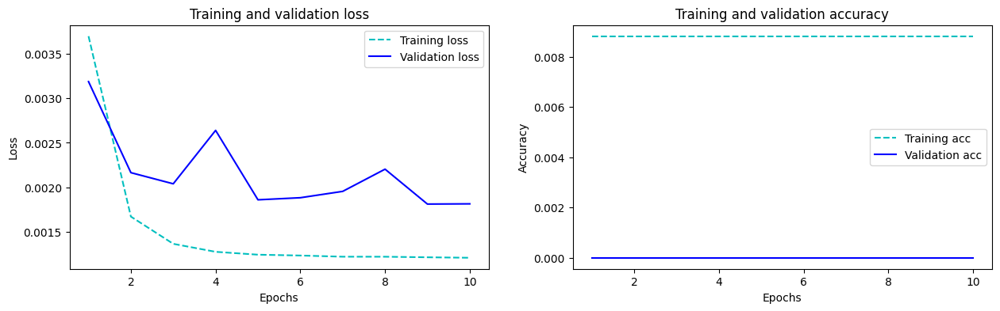

In [22]:
plot_curve(hist_50_rms)

In [23]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

10/10 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd,LSTM_50_rms
0,2021-12-16 09:10:00,0.111,0.334239,0.306975,0.329214
1,2021-12-16 09:11:00,0.112,0.143613,0.272049,0.132096
2,2021-12-16 09:12:00,0.116,0.123537,0.242181,0.110268
3,2021-12-16 09:13:00,0.112,0.129193,0.217421,0.113802
4,2021-12-16 09:14:00,0.099,0.123690,0.195984,0.112498
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.172833,0.175700,0.169507
289,2021-12-16 13:59:00,0.169,0.172558,0.174865,0.169308
290,2021-12-16 14:00:00,0.147,0.173407,0.174378,0.170214
291,2021-12-16 14:01:00,0.145,0.154693,0.169933,0.150562


In [24]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [25]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_rms)

Better MSE value is :  0.0018064799983601337


,Model,MSE error
0,model,0.001896
1,model_1,0.001806


In [166]:
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 RMSprop', lstm_mse_error_unit_50_rms]

In [167]:
mse_data

,Model,LSTM lag30
0,Lstm mse error unit 50 adam,0.001896
1,Lstm mse error unit 50 sgd,0.005241
2,Lstm mse error unit 50 RMSprop,0.001806


----------------------------------------------------------------------------------

## Optimizer RMSprop

### Add frist layer: units = 50 and batch_size 64

In [30]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
231/231 [==============================] - 8s 20ms/step - loss: 0.0113 - accuracy: 0.0088 - val_loss: 0.0049 - val_accuracy: 0.0000e+00
Epoch 2/10
231/231 [==============================] - 4s 17ms/step - loss: 0.0022 - accuracy: 0.0088 - val_loss: 0.0035 - val_accuracy: 0.0000e+00
Epoch 3/10
231/231 [==============================] - 4s 17ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 4/10
231/231 [==============================] - 4s 16ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 5/10
231/231 [==============================] - 4s 16ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
231/231 [==============================] - 4s 17ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 7/10
231/231 [==============================] - 4s 17ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.001

Last train loss: 0.001208313275128603
Last validation loss: 0.001906763412989676
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


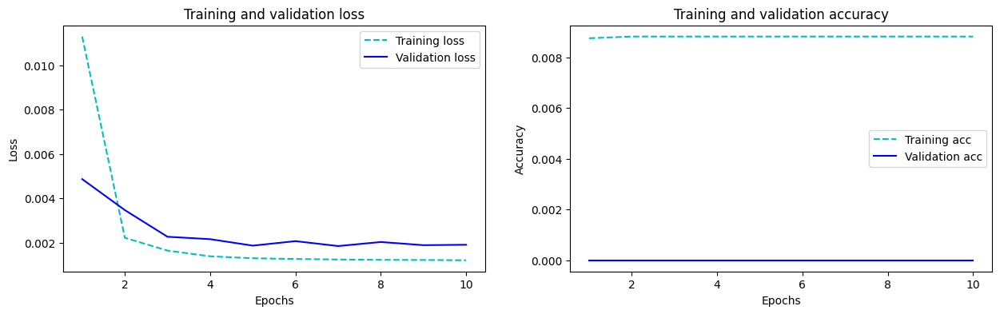

In [31]:
plot_curve(hist_batch_size64)

In [32]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-16 09:10:00,0.111,0.334239,0.306975,0.329214,0.335411
1,2021-12-16 09:11:00,0.112,0.143613,0.272049,0.132096,0.135265
2,2021-12-16 09:12:00,0.116,0.123537,0.242181,0.110268,0.115002
3,2021-12-16 09:13:00,0.112,0.129193,0.217421,0.113802,0.117072
4,2021-12-16 09:14:00,0.099,0.123690,0.195984,0.112498,0.115316
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.172833,0.175700,0.169507,0.172057
289,2021-12-16 13:59:00,0.169,0.172558,0.174865,0.169308,0.171853
290,2021-12-16 14:00:00,0.147,0.173407,0.174378,0.170214,0.172740
291,2021-12-16 14:01:00,0.145,0.154693,0.169933,0.150562,0.152863


In [33]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [34]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_rms,lstm_mse_error_batch_size64)

Better MSE value is :  0.0018064799983601337


,Model,MSE error
0,model,0.001806
1,model_1,0.001897


In [168]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop 50 batch_size64', lstm_mse_error_batch_size64]

---

### learning rate 0.1

In [36]:
test2 = test.copy()

#### Add frist layer: units = 50

In [37]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.RMSprop(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 9s 13ms/step - loss: 0.4120 - accuracy: 0.0088 - val_loss: 0.0030 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0082 - accuracy: 0.0088 - val_loss: 0.0173 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0070 - accuracy: 0.0088 - val_loss: 0.0058 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0064 - accuracy: 0.0088 - val_loss: 0.0060 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0062 - accuracy: 0.0088 - val_loss: 0.0058 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0058 - accuracy: 0.0088 - val_loss: 0.0041 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0059 - accuracy: 0.0088 - val_loss: 0.008

Last train loss: 0.006143759470432997
Last validation loss: 0.0037693167105317116
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


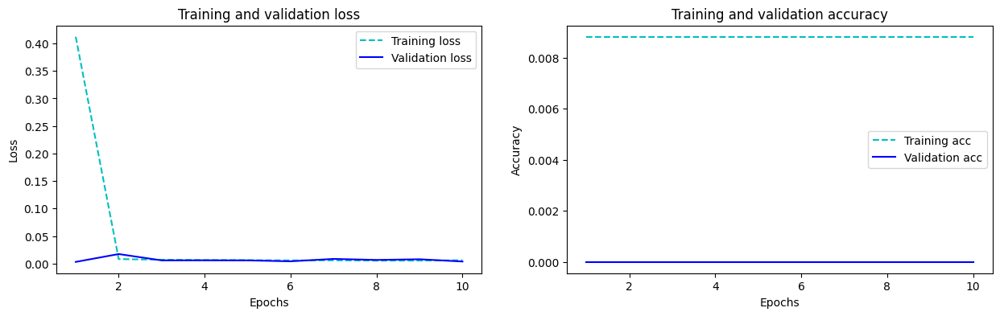

In [38]:
plot_curve(hist_01)

In [39]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-16 09:10:00,0.111,0.381184
1,2021-12-16 09:11:00,0.112,0.211676
2,2021-12-16 09:12:00,0.116,0.165202
3,2021-12-16 09:13:00,0.112,0.142870
4,2021-12-16 09:14:00,0.099,0.130457
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.206666
289,2021-12-16 13:59:00,0.169,0.206843
290,2021-12-16 14:00:00,0.147,0.208366
291,2021-12-16 14:01:00,0.145,0.178386


In [40]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [41]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_rms,lstm_mse_error_unit_50_01)

Better MSE value is :  0.0018064799983601337


,Model,MSE error
0,model,0.001806
1,model_1,0.003750


In [169]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop 50 learning rate 0.1', lstm_mse_error_unit_50_01]
mse_data

,Model,LSTM lag30
0,Lstm mse error unit 50 adam,0.001896
1,Lstm mse error unit 50 sgd,0.005241
2,Lstm mse error unit 50 RMSprop,0.001806
3,Lstm mse error RMSprop 50 batch_size64,0.001897
4,Lstm mse error RMSprop 50 learning rate 0.1,0.003750


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [43]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.RMSprop(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 11s 16ms/step - loss: 0.1986 - accuracy: 0.0084 - val_loss: 0.0107 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0055 - accuracy: 0.0088 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0037 - accuracy: 0.0088 - val_loss: 0.0041 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0032 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0030 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0028 - accuracy: 0.0088 - val_loss: 0.0207 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0028 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.002762490650638938
Last validation loss: 0.007269097492098808
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


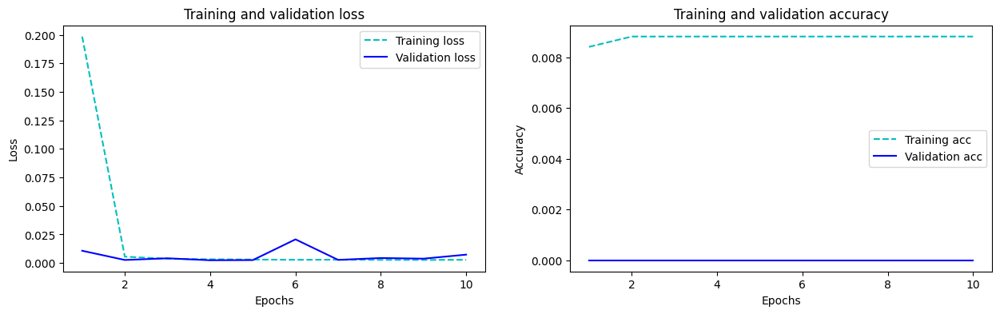

In [44]:
plot_curve(hist_005)

In [45]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-16 09:10:00,0.111,0.381184,0.396406
1,2021-12-16 09:11:00,0.112,0.211676,0.147876
2,2021-12-16 09:12:00,0.116,0.165202,0.171026
3,2021-12-16 09:13:00,0.112,0.142870,0.171928
4,2021-12-16 09:14:00,0.099,0.130457,0.174141
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.206666,0.239863
289,2021-12-16 13:59:00,0.169,0.206843,0.239710
290,2021-12-16 14:00:00,0.147,0.208366,0.240758
291,2021-12-16 14:01:00,0.145,0.178386,0.219218


In [46]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [47]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_rms,lstm_mse_error_unit_50_005)

Better MSE value is :  0.0018064799983601337


,Model,MSE error
0,model,0.001806
1,model_1,0.007233


In [170]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop 50 learning rate 0.05', lstm_mse_error_unit_50_005]

----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [49]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.RMSprop(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 9s 13ms/step - loss: 0.0161 - accuracy: 0.0085 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0024 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0019 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.001

Last train loss: 0.001401941990479827
Last validation loss: 0.001929203630425036
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


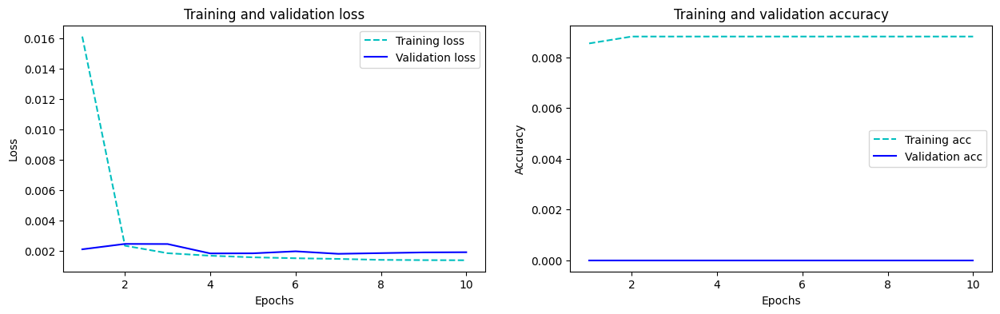

In [50]:
plot_curve(hist_001)

In [51]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-16 09:10:00,0.111,0.381184,0.396406,0.336201
1,2021-12-16 09:11:00,0.112,0.211676,0.147876,0.147538
2,2021-12-16 09:12:00,0.116,0.165202,0.171026,0.130386
3,2021-12-16 09:13:00,0.112,0.142870,0.171928,0.118616
4,2021-12-16 09:14:00,0.099,0.130457,0.174141,0.121988
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.206666,0.239863,0.176911
289,2021-12-16 13:59:00,0.169,0.206843,0.239710,0.176790
290,2021-12-16 14:00:00,0.147,0.208366,0.240758,0.177481
291,2021-12-16 14:01:00,0.145,0.178386,0.219218,0.158668


In [52]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [53]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_rms,lstm_mse_error_001)

Better MSE value is :  0.0018064799983601337


,Model,MSE error
0,model,0.001806
1,model_1,0.001920


In [171]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop 50 learning rate 0.01', lstm_mse_error_001]

----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [55]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.RMSprop(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 10s 14ms/step - loss: 0.0056 - accuracy: 0.0088 - val_loss: 0.0029 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0013343258760869503
Last validation loss: 0.0018942563328891993
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


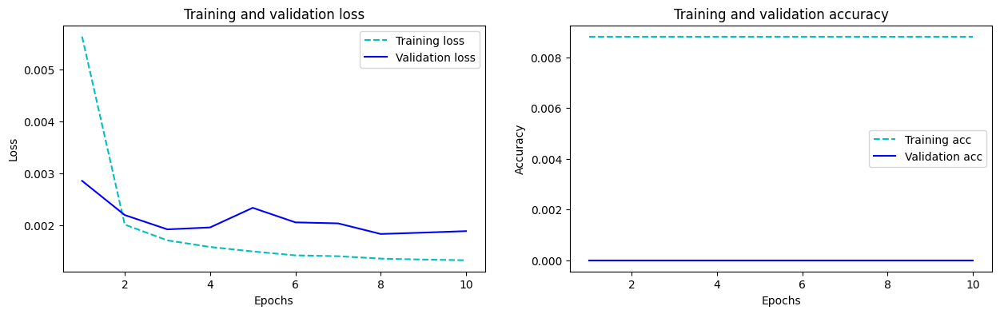

In [56]:
plot_curve(hist_0005)

In [57]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-16 09:10:00,0.111,0.381184,0.396406,0.336201,0.323223
1,2021-12-16 09:11:00,0.112,0.211676,0.147876,0.147538,0.131563
2,2021-12-16 09:12:00,0.116,0.165202,0.171026,0.130386,0.107994
3,2021-12-16 09:13:00,0.112,0.142870,0.171928,0.118616,0.108881
4,2021-12-16 09:14:00,0.099,0.130457,0.174141,0.121988,0.109769
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.206666,0.239863,0.176911,0.162312
289,2021-12-16 13:59:00,0.169,0.206843,0.239710,0.176790,0.162050
290,2021-12-16 14:00:00,0.147,0.208366,0.240758,0.177481,0.162814
291,2021-12-16 14:01:00,0.145,0.178386,0.219218,0.158668,0.143801


In [58]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [59]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_rms,lstm_mse_error_unit_50_0005)

Better MSE value is :  0.0018064799983601337


,Model,MSE error
0,model,0.001806
1,model_1,0.001885


In [172]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop 50 learning rate 0.005', lstm_mse_error_unit_50_0005]

----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [61]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.RMSprop(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 9s 13ms/step - loss: 0.0048 - accuracy: 0.0087 - val_loss: 0.0030 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 6s 13ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.001

Last train loss: 0.0012038371060043573
Last validation loss: 0.001874336856417358
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


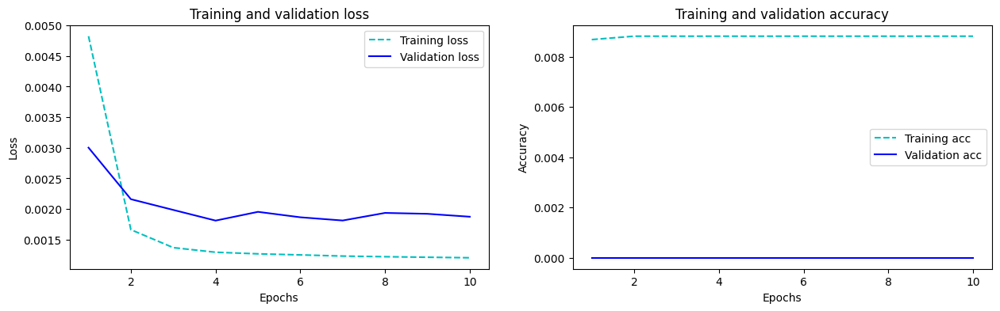

In [62]:
plot_curve(hist_0001)

In [63]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

10/10 [==============================] - 0s 5ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.381184,0.396406,0.336201,0.323223,0.336201
1,2021-12-16 09:11:00,0.112,0.211676,0.147876,0.147538,0.131563,0.147538
2,2021-12-16 09:12:00,0.116,0.165202,0.171026,0.130386,0.107994,0.130386
3,2021-12-16 09:13:00,0.112,0.142870,0.171928,0.118616,0.108881,0.118616
4,2021-12-16 09:14:00,0.099,0.130457,0.174141,0.121988,0.109769,0.121988
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.206666,0.239863,0.176911,0.162312,0.176911
289,2021-12-16 13:59:00,0.169,0.206843,0.239710,0.176790,0.162050,0.176790
290,2021-12-16 14:00:00,0.147,0.208366,0.240758,0.177481,0.162814,0.177481
291,2021-12-16 14:01:00,0.145,0.178386,0.219218,0.158668,0.143801,0.158668


In [64]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [65]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_rms,lstm_mse_error_0001)

Better MSE value is :  0.0018064799983601337


,Model,MSE error
0,model,0.001806
1,model_1,0.001920


In [173]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop 50 learning rate 0.001', lstm_mse_error_0001]

----------------------------------------------------------------------------------

## Optimizer RMSprop

### Add frist layer: units = 100

In [67]:
test3 = test.copy()

In [68]:
test3['LSTM_50'] = predict_50_rms

In [69]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
model_1.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 13s 20ms/step - loss: 0.0053 - accuracy: 0.0087 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 8s 18ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 8s 18ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 8s 18ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 8s 18ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 8s 18ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 8s 18ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0012572577688843012
Last validation loss: 0.0020112742204219103
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


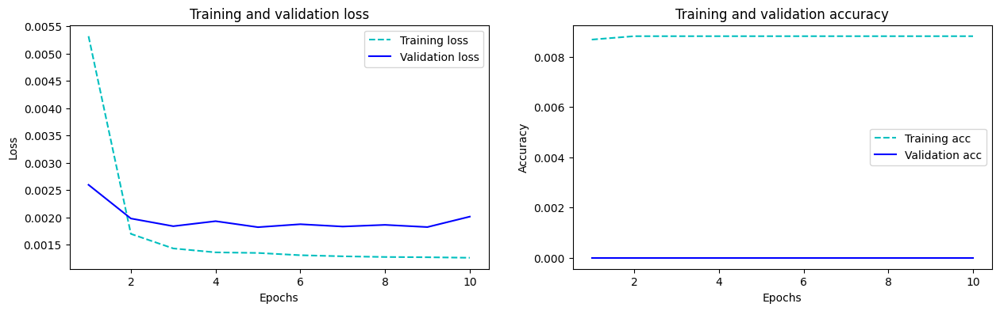

In [70]:
plot_curve(hist_1)

In [71]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

10/10 [==============================] - 1s 8ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-16 09:10:00,0.111,0.329214,0.341357
1,2021-12-16 09:11:00,0.112,0.132096,0.130004
2,2021-12-16 09:12:00,0.116,0.110268,0.118006
3,2021-12-16 09:13:00,0.112,0.113802,0.122427
4,2021-12-16 09:14:00,0.099,0.112498,0.122445
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169507,0.178600
289,2021-12-16 13:59:00,0.169,0.169308,0.178456
290,2021-12-16 14:00:00,0.147,0.170214,0.179380
291,2021-12-16 14:01:00,0.145,0.150562,0.157925


In [72]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [73]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_rms,lstm_mse_error_unit_100)

Better MSE value is :  0.0018064799983601337


,Model,MSE error
0,model,0.001806
1,model_1,0.002001


In [174]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop frist layer unit 100', lstm_mse_error_unit_100]

------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [75]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
model_2.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 10s 14ms/step - loss: 0.0071 - accuracy: 0.0088 - val_loss: 0.0037 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 6s 12ms/step - loss: 0.0028 - accuracy: 0.0088 - val_loss: 0.0029 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0024 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0021 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 5s 11ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 5s 12ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0016441949410364032
Last validation loss: 0.0018245928222313523
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


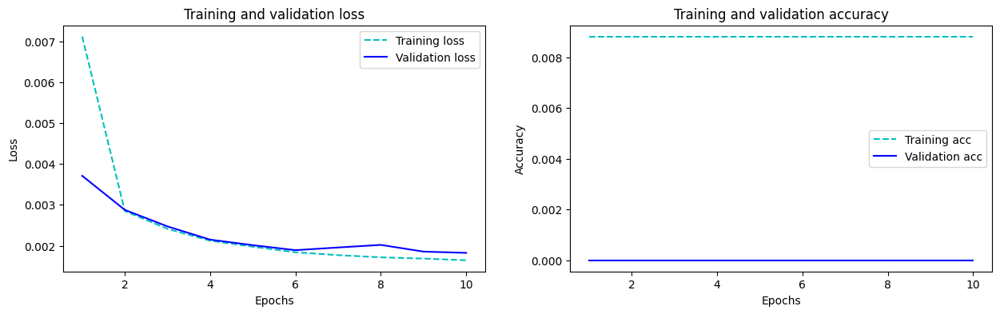

In [76]:
plot_curve(hist_2)

In [77]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-16 09:10:00,0.111,0.329214,0.341357,0.326872
1,2021-12-16 09:11:00,0.112,0.132096,0.130004,0.140957
2,2021-12-16 09:12:00,0.116,0.110268,0.118006,0.111157
3,2021-12-16 09:13:00,0.112,0.113802,0.122427,0.112837
4,2021-12-16 09:14:00,0.099,0.112498,0.122445,0.111890
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169507,0.178600,0.166839
289,2021-12-16 13:59:00,0.169,0.169308,0.178456,0.166522
290,2021-12-16 14:00:00,0.147,0.170214,0.179380,0.167317
291,2021-12-16 14:01:00,0.145,0.150562,0.157925,0.149180


In [78]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [79]:
lstm_mse_error_50_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_rms,lstm_mse_error_50_drop_out)

Better MSE value is :  0.0018064799983601337


,Model,MSE error
0,model,0.001806
1,model_1,0.001815


In [175]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop frist layer unit 50 drop out 0.1', lstm_mse_error_50_drop_out]

------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [81]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
model_3.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 19s 27ms/step - loss: 0.0060 - accuracy: 0.0088 - val_loss: 0.0036 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 10s 22ms/step - loss: 0.0021 - accuracy: 0.0088 - val_loss: 0.0026 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 11s 23ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 11s 25ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 11s 24ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 10s 22ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 11s 24ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss

Last train loss: 0.0013078791089355946
Last validation loss: 0.0018144453642889857
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


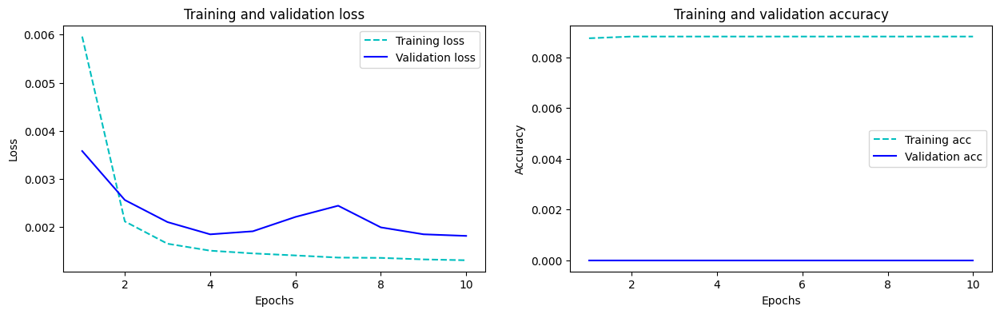

In [82]:
plot_curve(hist_3)

In [83]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

10/10 [==============================] - 2s 11ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-16 09:10:00,0.111,0.329214,0.341357,0.326872,0.320868
1,2021-12-16 09:11:00,0.112,0.132096,0.130004,0.140957,0.122688
2,2021-12-16 09:12:00,0.116,0.110268,0.118006,0.111157,0.106747
3,2021-12-16 09:13:00,0.112,0.113802,0.122427,0.112837,0.112923
4,2021-12-16 09:14:00,0.099,0.112498,0.122445,0.111890,0.114251
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169507,0.178600,0.166839,0.165724
289,2021-12-16 13:59:00,0.169,0.169308,0.178456,0.166522,0.165538
290,2021-12-16 14:00:00,0.147,0.170214,0.179380,0.167317,0.166385
291,2021-12-16 14:01:00,0.145,0.150562,0.157925,0.149180,0.146606


In [84]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [85]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_rms,lstm_mse_error_second_layer)

Better MSE value is :  0.0018053841335819358


,Model,MSE error
0,model,0.001806
1,model_1,0.001805


In [176]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop 50 second layer unit 50', lstm_mse_error_second_layer]

---

### Add frist layer: units = 50 and Add second layer: unit = 100

In [93]:
model_4 = Sequential()
model_4.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_4.add(LSTM(units = 100))
model_4.add(Dense(units = 1))
model_4.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_4 = model_4.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 22s 33ms/step - loss: 0.0066 - accuracy: 0.0086 - val_loss: 0.0033 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 14s 29ms/step - loss: 0.0022 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 13s 29ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 14s 30ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 14s 29ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 17s 38ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 15s 32ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss

Last train loss: 0.001385785173624754
Last validation loss: 0.0018182225758209825
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


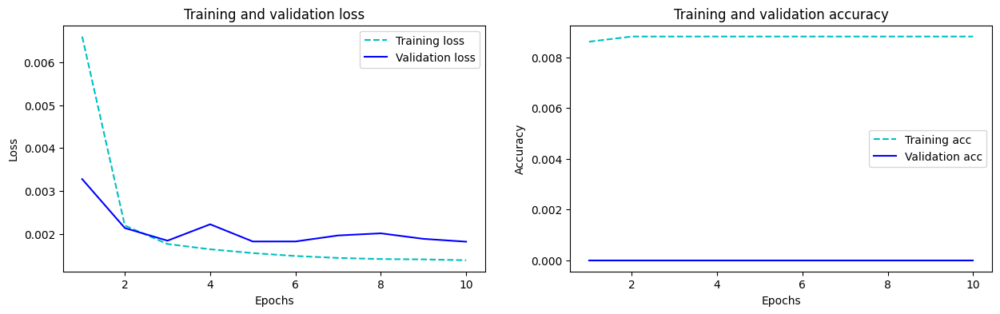

In [94]:
plot_curve(hist_4)

In [95]:
predict_scaled_4 = model_4.predict(X_test)
predict_4 = sc.inverse_transform(predict_scaled_4)
test3['LSTM_second_layer_100'] = predict_4
test3

10/10 [==============================] - 1s 10ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100
0,2021-12-16 09:10:00,0.111,0.329214,0.341357,0.326872,0.320868,0.324640
1,2021-12-16 09:11:00,0.112,0.132096,0.130004,0.140957,0.122688,0.128455
2,2021-12-16 09:12:00,0.116,0.110268,0.118006,0.111157,0.106747,0.124693
3,2021-12-16 09:13:00,0.112,0.113802,0.122427,0.112837,0.112923,0.121922
4,2021-12-16 09:14:00,0.099,0.112498,0.122445,0.111890,0.114251,0.123074
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169507,0.178600,0.166839,0.165724,0.172723
289,2021-12-16 13:59:00,0.169,0.169308,0.178456,0.166522,0.165538,0.172709
290,2021-12-16 14:00:00,0.147,0.170214,0.179380,0.167317,0.166385,0.173470
291,2021-12-16 14:01:00,0.145,0.150562,0.157925,0.149180,0.146606,0.153250


In [96]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [97]:
lstm_mse_error_second_layer_unit100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_100'], squared=True)
compare_mse_model(lstm_mse_error_second_layer,lstm_mse_error_second_layer_unit100)

Better MSE value is :  0.0018053841335819358


,Model,MSE error
0,model,0.001805
1,model_1,0.001809


In [177]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop 50 second layer unit 100', lstm_mse_error_second_layer_unit100]
mse_data

,Model,LSTM lag30
0,Lstm mse error unit 50 adam,0.001896
1,Lstm mse error unit 50 sgd,0.005241
2,Lstm mse error unit 50 RMSprop,0.001806
3,Lstm mse error RMSprop 50 batch_size64,0.001897
4,Lstm mse error RMSprop 50 learning rate 0.1,0.003750
5,Lstm mse error RMSprop 50 learning rate 0.05,0.007233
6,Lstm mse error RMSprop 50 learning rate 0.01,0.001920
7,Lstm mse error RMSprop 50 learning rate 0.005,0.001885
8,Lstm mse error RMSprop 50 learning rate 0.001,0.001920
9,Lstm mse error RMSprop frist layer unit 100,0.002001


---

### Add frist layer: units = 50 and change epochs from 10 to 30

In [159]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_5.add(LSTM(units= 50))
model_5.add(Dense(units = 1))
model_5.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 30, batch_size = 32)

Epoch 1/30
461/461 [==============================] - 24s 32ms/step - loss: 0.0061 - accuracy: 0.0088 - val_loss: 0.0032 - val_accuracy: 0.0000e+00
Epoch 2/30
461/461 [==============================] - 14s 30ms/step - loss: 0.0021 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 3/30
461/461 [==============================] - 13s 28ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 4/30
461/461 [==============================] - 12s 27ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/30
461/461 [==============================] - 13s 28ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 6/30
461/461 [==============================] - 14s 31ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/30
461/461 [==============================] - 11s 23ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss

Last train loss: 0.0012273865286260843
Last validation loss: 0.0018898327834904194
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


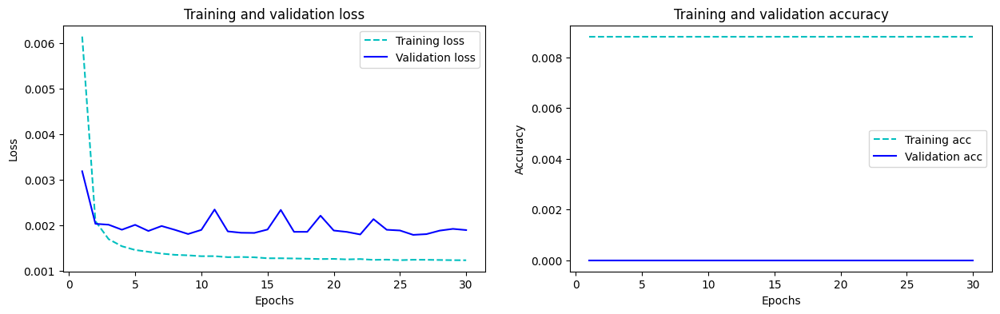

In [160]:
plot_curve(hist_5)

In [161]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch30'] = predict_5
test3

10/10 [==============================] - 2s 14ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100,LSTM_epoch30,LSTM_epoch50
0,2021-12-16 09:10:00,0.111,0.329214,0.341357,0.326872,0.320868,0.324640,0.332534,0.329408
1,2021-12-16 09:11:00,0.112,0.132096,0.130004,0.140957,0.122688,0.128455,0.135912,0.123230
2,2021-12-16 09:12:00,0.116,0.110268,0.118006,0.111157,0.106747,0.124693,0.130085,0.116184
3,2021-12-16 09:13:00,0.112,0.113802,0.122427,0.112837,0.112923,0.121922,0.121634,0.119123
4,2021-12-16 09:14:00,0.099,0.112498,0.122445,0.111890,0.114251,0.123074,0.124058,0.126058
...,...,...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169507,0.178600,0.166839,0.165724,0.172723,0.175643,0.172706
289,2021-12-16 13:59:00,0.169,0.169308,0.178456,0.166522,0.165538,0.172709,0.175559,0.172491
290,2021-12-16 14:00:00,0.147,0.170214,0.179380,0.167317,0.166385,0.173470,0.176254,0.173324
291,2021-12-16 14:01:00,0.145,0.150562,0.157925,0.149180,0.146606,0.153250,0.156282,0.152462


In [162]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch30'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [163]:
lstm_mse_error_unit_50_epoch30 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch30'], squared=True)
compare_mse_model(lstm_mse_error_second_layer,lstm_mse_error_unit_50_epoch30)

Better MSE value is :  0.0018053841335819358


,Model,MSE error
0,model,0.001805
1,model_1,0.001880


In [178]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop 50 epoch 30', lstm_mse_error_unit_50_epoch30]

---

### Add frist layer: units = 50 and Add second layer: unit = 50 drop out

In [189]:
model_6 = Sequential()
model_6.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_6.add(LSTM(units = 50))
model_6.add(Dropout(0.1))
model_6.add(Dense(units = 1))
model_6.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_6 = model_6.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 21s 30ms/step - loss: 0.0072 - accuracy: 0.0088 - val_loss: 0.0038 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 10s 22ms/step - loss: 0.0034 - accuracy: 0.0088 - val_loss: 0.0027 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 10s 21ms/step - loss: 0.0027 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 10s 21ms/step - loss: 0.0023 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 10s 22ms/step - loss: 0.0022 - accuracy: 0.0088 - val_loss: 0.0024 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 10s 22ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 10s 22ms/step - loss: 0.0019 - accuracy: 0.0088 - val_loss

Last train loss: 0.0017471981700509787
Last validation loss: 0.0018855069065466523
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


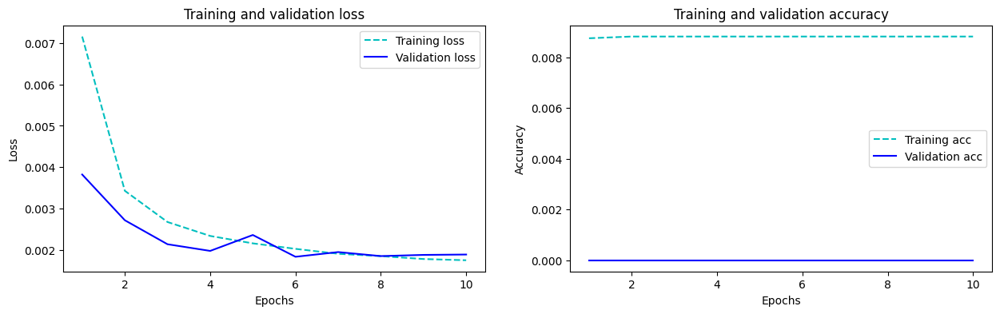

In [190]:
plot_curve(hist_6)

In [191]:
predict_scaled_6 = model_6.predict(X_test)
predict_6 = sc.inverse_transform(predict_scaled_6)
test3['LSTM_second_layer_50_drop_out'] = predict_6
test3

10/10 [==============================] - 1s 8ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100,LSTM_epoch30,LSTM_epoch50,LSTM_second_layer_50_drop_out
0,2021-12-16 09:10:00,0.111,0.329214,0.341357,0.326872,0.320868,0.324640,0.332534,0.329408,0.314162
1,2021-12-16 09:11:00,0.112,0.132096,0.130004,0.140957,0.122688,0.128455,0.135912,0.123230,0.133631
2,2021-12-16 09:12:00,0.116,0.110268,0.118006,0.111157,0.106747,0.124693,0.130085,0.116184,0.108253
3,2021-12-16 09:13:00,0.112,0.113802,0.122427,0.112837,0.112923,0.121922,0.121634,0.119123,0.112163
4,2021-12-16 09:14:00,0.099,0.112498,0.122445,0.111890,0.114251,0.123074,0.124058,0.126058,0.111141
...,...,...,...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169507,0.178600,0.166839,0.165724,0.172723,0.175643,0.172706,0.163127
289,2021-12-16 13:59:00,0.169,0.169308,0.178456,0.166522,0.165538,0.172709,0.175559,0.172491,0.162885
290,2021-12-16 14:00:00,0.147,0.170214,0.179380,0.167317,0.166385,0.173470,0.176254,0.173324,0.163708
291,2021-12-16 14:01:00,0.145,0.150562,0.157925,0.149180,0.146606,0.153250,0.156282,0.152462,0.145534


In [192]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50_drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [193]:
lstm_mse_error_second_layer_drop = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50_drop_out'], squared=True)
compare_mse_model(lstm_mse_error_second_layer,lstm_mse_error_second_layer_drop)

Better MSE value is :  0.0018053841335819358


,Model,MSE error
0,model,0.001805
1,model_1,0.001876


In [194]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop 50 second layer unit 50 drop out 0.1', lstm_mse_error_second_layer_drop]

---

### Add frist layer: units = 50 and Add second layer: unit = 50 and third layer 50

In [195]:
model_7 = Sequential()
model_7.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_7.add(LSTM(units = 50, return_sequences = True))
model_7.add(LSTM(units = 50))
model_7.add(Dense(units = 1))
model_7.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_7 = model_7.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
461/461 [==============================] - 27s 41ms/step - loss: 0.0091 - accuracy: 0.0088 - val_loss: 0.0046 - val_accuracy: 0.0000e+00
Epoch 2/10
461/461 [==============================] - 16s 35ms/step - loss: 0.0029 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 3/10
461/461 [==============================] - 16s 35ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
461/461 [==============================] - 16s 34ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
461/461 [==============================] - 15s 33ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 6/10
461/461 [==============================] - 15s 33ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 7/10
461/461 [==============================] - 15s 33ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss

Last train loss: 0.00142378406599164
Last validation loss: 0.0020264829508960247
Last train accuracy: 0.008820735849440098
Last validation accuracy: 0.0


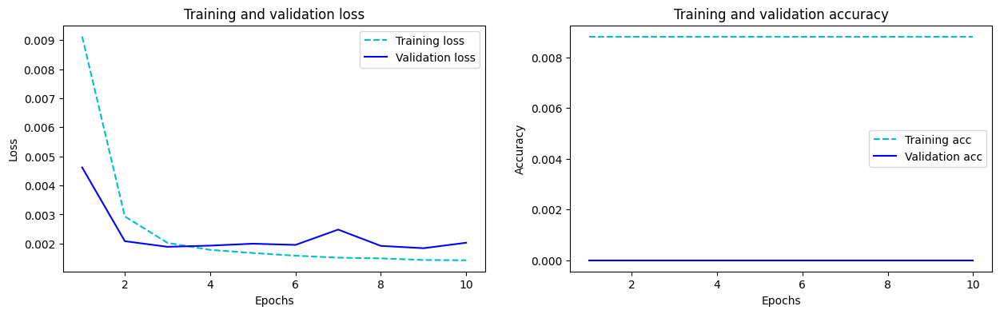

In [196]:
plot_curve(hist_7)

In [197]:
predict_scaled_7 = model_7.predict(X_test)
predict_7 = sc.inverse_transform(predict_scaled_7)
test3['LSTM_third_layer_50'] = predict_7
test3

10/10 [==============================] - 2s 11ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100,LSTM_epoch30,LSTM_epoch50,LSTM_second_layer_50_drop_out,LSTM_third_layer_50
0,2021-12-16 09:10:00,0.111,0.329214,0.341357,0.326872,0.320868,0.324640,0.332534,0.329408,0.314162,0.334844
1,2021-12-16 09:11:00,0.112,0.132096,0.130004,0.140957,0.122688,0.128455,0.135912,0.123230,0.133631,0.139054
2,2021-12-16 09:12:00,0.116,0.110268,0.118006,0.111157,0.106747,0.124693,0.130085,0.116184,0.108253,0.121194
3,2021-12-16 09:13:00,0.112,0.113802,0.122427,0.112837,0.112923,0.121922,0.121634,0.119123,0.112163,0.121873
4,2021-12-16 09:14:00,0.099,0.112498,0.122445,0.111890,0.114251,0.123074,0.124058,0.126058,0.111141,0.122028
...,...,...,...,...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.169507,0.178600,0.166839,0.165724,0.172723,0.175643,0.172706,0.163127,0.172375
289,2021-12-16 13:59:00,0.169,0.169308,0.178456,0.166522,0.165538,0.172709,0.175559,0.172491,0.162885,0.172141
290,2021-12-16 14:00:00,0.147,0.170214,0.179380,0.167317,0.166385,0.173470,0.176254,0.173324,0.163708,0.172901
291,2021-12-16 14:01:00,0.145,0.150562,0.157925,0.149180,0.146606,0.153250,0.156282,0.152462,0.145534,0.153537


In [198]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_third_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [199]:
lstm_mse_error_third_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_third_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_second_layer,lstm_mse_error_third_layer)

Better MSE value is :  0.0018053841335819358


,Model,MSE error
0,model,0.001805
1,model_1,0.002016


In [200]:
mse_data.loc[len(mse_data)] = ['Lstm mse error RMSprop 50 50 third layer 50', lstm_mse_error_third_layer]

---

In [201]:
mse_data

,Model,LSTM lag30
0,Lstm mse error unit 50 adam,0.001896
1,Lstm mse error unit 50 sgd,0.005241
2,Lstm mse error unit 50 RMSprop,0.001806
3,Lstm mse error RMSprop 50 batch_size64,0.001897
4,Lstm mse error RMSprop 50 learning rate 0.1,0.003750
5,Lstm mse error RMSprop 50 learning rate 0.05,0.007233
6,Lstm mse error RMSprop 50 learning rate 0.01,0.001920
7,Lstm mse error RMSprop 50 learning rate 0.005,0.001885
8,Lstm mse error RMSprop 50 learning rate 0.001,0.001920
9,Lstm mse error RMSprop frist layer unit 100,0.002001


In [202]:
minimum_mse= mse_data.loc[mse_data['LSTM lag30'].idxmin()]
minimum_mse

Model         Lstm mse error RMSprop 50 second layer unit 50
LSTM lag30                                          0.001805
Name: 11, dtype: object

In [203]:
data_mse = pd.read_csv('data_lstm_mse.csv')
data_mse

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15,LSTM lag20,LSTM lag25,LSTM lag30
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858,0.001823,0.001807,0.001896
1,Lstm mse error unit 50 sgd,0.001811,0.003412,0.005053,0.004738,0.005080,0.004923,0.005241
2,Lstm mse error unit 50 RMSprop,0.001818,0.001846,0.001882,0.001867,0.001825,0.001845,0.001806
3,Lstm mse error adam 50 batch_size64,0.001813,0.002645,0.002490,0.002184,0.001861,0.001964,NaN
4,Lstm mse error adam 50 learning rate 0.1,0.002110,0.002288,0.010058,0.002401,0.001952,0.002321,NaN
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924,0.001887,0.001954,NaN
6,Lstm mse error adam 50 learning rate 0.01,0.001828,0.001973,0.002654,0.001864,0.002085,0.001886,NaN
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923,0.001812,0.001780,NaN
8,Lstm mse error adam 50 learning rate 0.001,0.001828,0.001973,0.002654,0.001864,0.002085,0.001886,NaN
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799,NaN,NaN,NaN


In [204]:
data_mse1 = data_mse.drop(['LSTM lag30'], axis=1)
data_mse1

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15,LSTM lag20,LSTM lag25
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858,0.001823,0.001807
1,Lstm mse error unit 50 sgd,0.001811,0.003412,0.005053,0.004738,0.005080,0.004923
2,Lstm mse error unit 50 RMSprop,0.001818,0.001846,0.001882,0.001867,0.001825,0.001845
3,Lstm mse error adam 50 batch_size64,0.001813,0.002645,0.002490,0.002184,0.001861,0.001964
4,Lstm mse error adam 50 learning rate 0.1,0.002110,0.002288,0.010058,0.002401,0.001952,0.002321
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924,0.001887,0.001954
6,Lstm mse error adam 50 learning rate 0.01,0.001828,0.001973,0.002654,0.001864,0.002085,0.001886
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923,0.001812,0.001780
8,Lstm mse error adam 50 learning rate 0.001,0.001828,0.001973,0.002654,0.001864,0.002085,0.001886
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799,NaN,NaN


In [205]:
mse = pd.merge(data_mse1,mse_data, on = 'Model', how='outer')
mse

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15,LSTM lag20,LSTM lag25,LSTM lag30
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858,0.001823,0.001807,0.001896
1,Lstm mse error unit 50 sgd,0.001811,0.003412,0.005053,0.004738,0.005080,0.004923,0.005241
2,Lstm mse error unit 50 RMSprop,0.001818,0.001846,0.001882,0.001867,0.001825,0.001845,0.001806
3,Lstm mse error adam 50 batch_size64,0.001813,0.002645,0.002490,0.002184,0.001861,0.001964,NaN
4,Lstm mse error adam 50 learning rate 0.1,0.002110,0.002288,0.010058,0.002401,0.001952,0.002321,NaN
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924,0.001887,0.001954,NaN
6,Lstm mse error adam 50 learning rate 0.01,0.001828,0.001973,0.002654,0.001864,0.002085,0.001886,NaN
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923,0.001812,0.001780,NaN
8,Lstm mse error adam 50 learning rate 0.001,0.001828,0.001973,0.002654,0.001864,0.002085,0.001886,NaN
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799,NaN,NaN,NaN


In [206]:
# mse["LSTM lag1", "LSTM lag5"] = pd.to_numeric(mse["LSTM lag1", "LSTM lag5"])
minimum_mse1= mse[['LSTM lag1','LSTM lag5','LSTM lag10','LSTM lag15','LSTM lag20','LSTM lag25','LSTM lag30']].idxmin()
minimum_mse1

LSTM lag1      0
LSTM lag5     17
LSTM lag10     5
LSTM lag15     9
LSTM lag20     7
LSTM lag25     7
LSTM lag30    42
dtype: int64

In [209]:
minimum_mse1= mse.loc[mse[['LSTM lag1','LSTM lag5','LSTM lag10','LSTM lag15','LSTM lag20','LSTM lag25','LSTM lag30']].idxmin()]
minimum_mse1

,Model,LSTM lag1,LSTM lag5,LSTM lag10,LSTM lag15,LSTM lag20,LSTM lag25,LSTM lag30
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867,0.001858,0.001823,0.001807,0.001896
17,Lstm mse error adam 100 second layer unit 100,NaN,0.001801,NaN,0.001830,NaN,NaN,NaN
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830,0.003924,0.001887,0.001954,NaN
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN,0.001799,NaN,NaN,NaN
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923,0.001812,0.001780,NaN
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841,0.001923,0.001812,0.001780,NaN
42,Lstm mse error RMSprop 50 second layer unit 50,NaN,NaN,NaN,NaN,NaN,NaN,0.001805


In [208]:
mse.to_csv('data_lstm_mse.csv', index=False)

In [188]:
model_3.save('model_lag30.h5')